In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,cross_val_predict,cross_val_score,KFold,StratifiedKFold,LeaveOneOut
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score,classification_report, roc_auc_score, auc, confusion_matrix, precision_score, recall_score
from imblearn.over_sampling import RandomOverSampler, SMOTE,ADASYN
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, EditedNearestNeighbours
from imblearn.combine import SMOTETomek, SMOTEENN

import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv(r"C:\Users\lohit\OneDrive\Teks academy\project dataset\Project 7\Parkinsson disease.csv")

In [4]:
df.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [5]:
df.columns

Index(['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

In [6]:
df['status'].value_counts()

status
1    147
0     48
Name: count, dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [8]:
del df['name']

In [9]:
x = df.drop(columns='status')


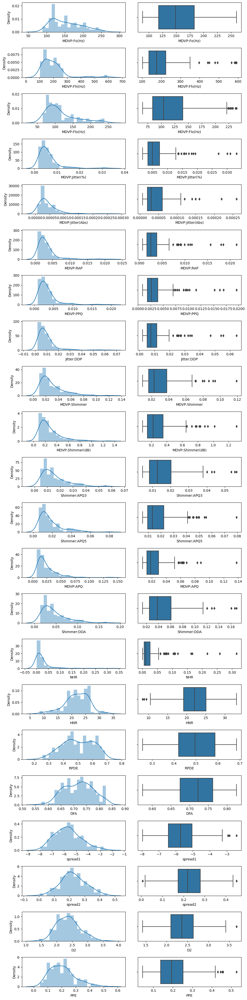

In [10]:
fig,ax = plt.subplots(len(x.columns),2,figsize=(10,40))
for i,col in enumerate(x.columns):
    sns.distplot(df[col],bins=20,ax = ax[i,0])
    sns.boxplot(data=x,x=col,ax = ax[i,1])
    plt.tight_layout() 

''

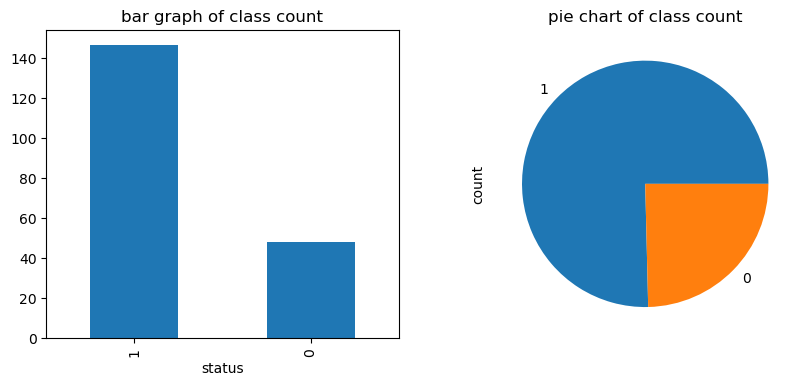

In [16]:
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
df['status'].value_counts().plot(kind='bar')
plt.title('bar graph of class count')

plt.subplot(1,2,2)
df['status'].value_counts().plot(kind='pie')
plt.title('pie chart of class count')
;

In [18]:
y = df['status']

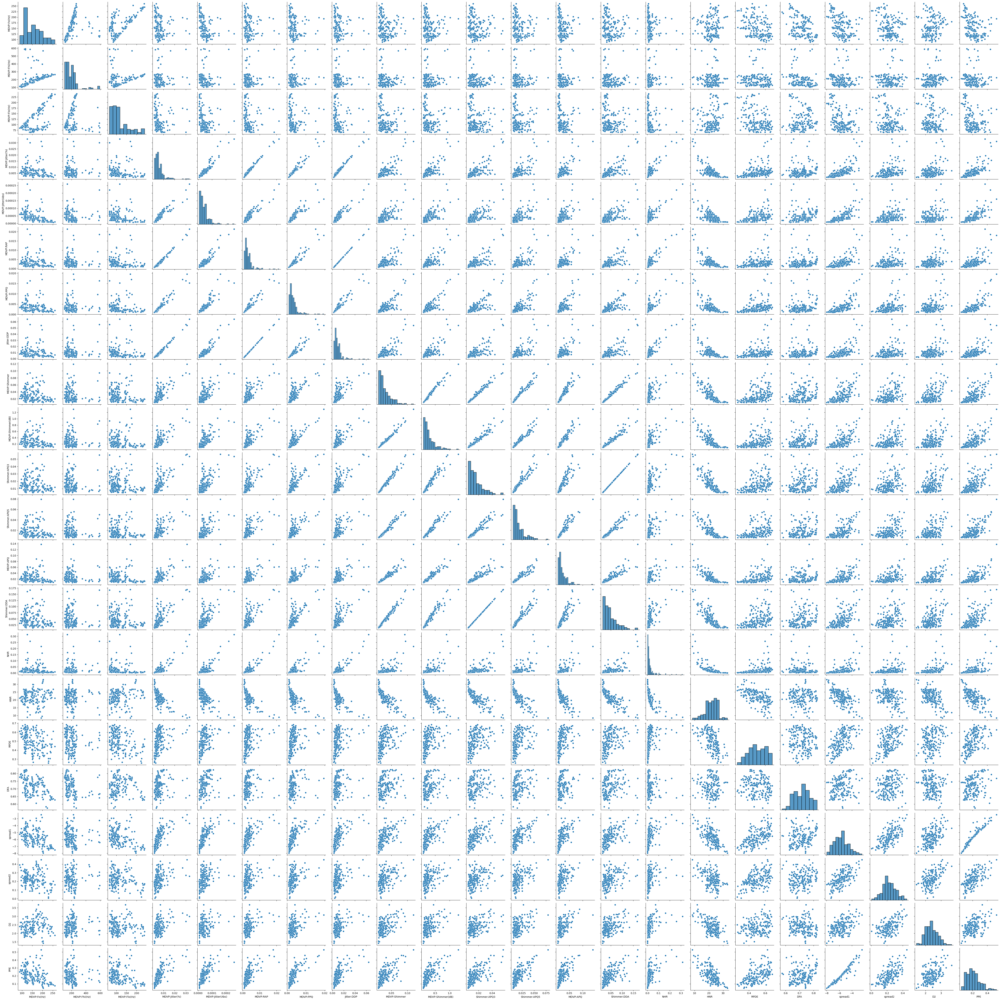

In [20]:
sns.pairplot(data=x)

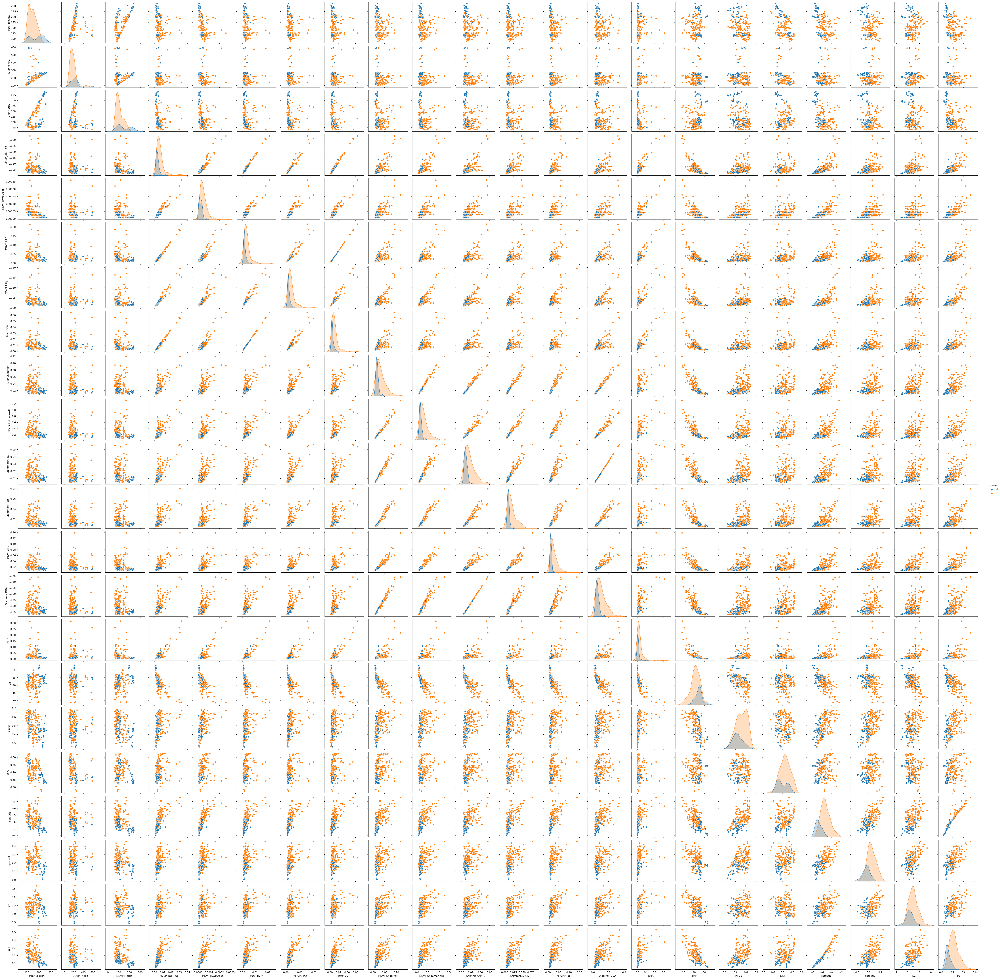

In [22]:
sns.pairplot(data=df,hue='status')

In [27]:
models = [LogisticRegression(),DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_split=4),
         SVC(kernel='rbf'),GaussianNB(),KNeighborsClassifier(n_neighbors=5),
          BaggingClassifier(estimator=DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_split=4),n_estimators=100,max_samples=10),
          RandomForestClassifier(criterion='gini',max_depth=10,min_samples_split=4,n_estimators=100,max_samples=0.6,max_features=0.6)
         ]

In [32]:
for mod in models:
    scores = cross_val_score(estimator=mod,X=x,y=y,cv=KFold(5),n_jobs=-1)
    print(mod)
    print(scores)
    print(f'mean score is {np.round(scores.mean(),4)}')
    print('---'*20)

LogisticRegression()
[0.92307692 0.79487179 0.87179487 0.97435897 0.51282051]
mean score is 0.8154
------------------------------------------------------------
DecisionTreeClassifier(max_depth=10, min_samples_split=4)
[0.79487179 0.74358974 0.84615385 0.94871795 0.61538462]
mean score is 0.7897
------------------------------------------------------------
SVC()
[0.84615385 0.53846154 0.92307692 0.97435897 0.48717949]
mean score is 0.7538
------------------------------------------------------------
GaussianNB()
[0.58974359 0.84615385 0.71794872 0.66666667 0.58974359]
mean score is 0.6821
------------------------------------------------------------
KNeighborsClassifier()
[0.79487179 0.69230769 0.8974359  0.79487179 0.48717949]
mean score is 0.7333
------------------------------------------------------------
BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=10,
                                                   min_samples_split=4),
                  max_samples=10, n_estimators

In [34]:
for mod in models:
    y_pred = cross_val_predict(estimator=mod,X=x,y=y,cv=StratifiedKFold(5),n_jobs=-1)
    print(mod)
    print(classification_report(y,y_pred))
    print('---'*20)

LogisticRegression()
              precision    recall  f1-score   support

           0       0.72      0.48      0.57        48
           1       0.85      0.94      0.89       147

    accuracy                           0.83       195
   macro avg       0.78      0.71      0.73       195
weighted avg       0.82      0.83      0.81       195

------------------------------------------------------------
DecisionTreeClassifier(max_depth=10, min_samples_split=4)
              precision    recall  f1-score   support

           0       0.48      0.42      0.44        48
           1       0.82      0.85      0.83       147

    accuracy                           0.74       195
   macro avg       0.65      0.63      0.64       195
weighted avg       0.73      0.74      0.74       195

------------------------------------------------------------
SVC()
              precision    recall  f1-score   support

           0       0.71      0.21      0.32        48
           1       0.79      0

In [35]:
x_train,x_test,y_train,y_test = train_test_split(x,y,random_state=19,test_size=0.2,stratify=y)

In [36]:
resamplers = [RandomOverSampler(),SMOTE(),ADASYN(),RandomUnderSampler(),EditedNearestNeighbours(),TomekLinks(),SMOTEENN,SMOTETomek()]

models = [LogisticRegression(),DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_split=4),
         SVC(kernel='rbf'),GaussianNB(),KNeighborsClassifier(n_neighbors=5),
          BaggingClassifier(estimator=DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_split=4),n_estimators=100,max_samples=10),
          RandomForestClassifier(criterion='gini',max_depth=10,min_samples_split=4,n_estimators=100,max_samples=0.6,max_features=0.6)
         ]

for res in resamplers:
    x_train_res, y_train_res = res.fit_resample(x_train,y_train)
    for mod in models:
        model = mod
        model.fit(x_train_res,y_train_res)
        y_pred = model.predict(x_test)
        print(res)
        print(mod)
        print(confusion_matrix(y_test,y_pred))
        print(classification_report(y_test,y_pred))
        print('---'*20)
    

RandomOverSampler()
LogisticRegression()
[[ 9  1]
 [ 7 22]]
              precision    recall  f1-score   support

           0       0.56      0.90      0.69        10
           1       0.96      0.76      0.85        29

    accuracy                           0.79        39
   macro avg       0.76      0.83      0.77        39
weighted avg       0.86      0.79      0.81        39

------------------------------------------------------------
RandomOverSampler()
DecisionTreeClassifier(max_depth=10, min_samples_split=4)
[[ 6  4]
 [ 3 26]]
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        10
           1       0.87      0.90      0.88        29

    accuracy                           0.82        39
   macro avg       0.77      0.75      0.76        39
weighted avg       0.82      0.82      0.82        39

------------------------------------------------------------
RandomOverSampler()
SVC()
[[ 5  5]
 [ 9 20]]
              precisio

TypeError: BaseSampler.fit_resample() missing 1 required positional argument: 'y'